<a href="https://colab.research.google.com/github/Durgnan/Computer-Vision-and-Imaging-Assignment/blob/master/CV_Assignment_Code.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import the Libraries

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd


from scipy.io import loadmat

from skimage.measure import label as skimage_label
from skimage.metrics import (adapted_rand_error, contingency_table, variation_of_information)
from skimage.segmentation import join_segmentations
from skimage.filters import threshold_otsu
from sklearn.cluster import KMeans
import cv2
from collections import deque as dq
from utils import show_rgb_image, show_binary_image, sample_gaussian, zero_cross

# Preprocessing the Images

In [3]:
# Load the Data
data = loadmat('Brain.mat')
T1 = data['T1']
label = data['label']

# Generic Functions

Segmented Image Comparison by Original and Ground Truth

In [4]:
# Show the segmentation result to be compared visually by
def show_compared_images(t1_image, ground_truth, segmented_image, segmented_image_title):
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 15))

    # Show T1 Image
    image1 = ax1.imshow(t1_image)
    fig.colorbar(image1, ax=ax1, location='bottom',pad=0.01)
    ax1.set_title('Original T1 Image', fontsize=15)
    ax1.axis('off')

    # Show Label Image with Colorbar
    image2 = ax2.imshow(ground_truth)
    fig.colorbar(image2, ax=ax2, location='bottom',pad=0.01)
    ax2.set_title('Label Image', fontsize=15)
    ax2.axis('off')

    # Show Segmented Image Slice
    image3 = ax3.imshow(segmented_image)
    fig.colorbar(image3, ax=ax3, location='bottom', pad=0.01)
    ax3.set_title(segmented_image_title, fontsize=15)
    ax3.axis('off')
    plt.show()



Normalise the matrix

In [5]:
def normalise_image(image):
  reshaped_image = np.reshape(image, (-1, 1))
  return (reshaped_image - np.mean(reshaped_image))/np.std(reshaped_image)

Image Evaludation Metrics

In [6]:
def evaluation_metrics(image, ground_truth, print_metrics=True):
    # Calculate True Positives (TP), False Positives (FP), and False Negatives (FN)
    TP = np.sum(image & ground_truth)
    FP = np.sum(image & (~ground_truth))
    FN = np.sum((~image) & ground_truth)
    TN = np.sum((~image) & ground_truth)

    # Calculate Dice coefficient
    dice_coefficient = 2 * TP / (2 * TP + FP + FN)

    # Calculate Jaccard index
    jaccard_index = TP / (TP + FP + FN)

    # Calculate pixel accuracy
    pixel_accuracy = (TP + TN) / (TP + FP + TN + FN)

    # Calculate Sensitivity
    sensitivity = TP / (TP + FN)

    # Calculate Specificity
    specificity = TN / (TN + FP)

    # Print the calculated metrics
    if print_metrics:
      print("Dice coefficient:", dice_coefficient)
      print("Jaccard index:", jaccard_index)
      print("Pixel accuracy:", pixel_accuracy)
      print("Sensitivity:", sensitivity)
      print("Specificity:", specificity)
    return dice_coefficient, jaccard_index, pixel_accuracy, sensitivity, specificity

Combine Region Grown Image

In [7]:
def combine_images(img_array, intensity_arr, threshold_value = 255):
  combined_image = np.zeros_like(img_array[0])
  alias_img = img_array
  for i in range(len(img_array)):
    alias_img[i] = np.where(alias_img[i] < 255, alias_img[i], intensity_arr[i])
    combined_image = np.maximum(combined_image, alias_img[i])

  return combined_image


Normalise CSF Layer

In [8]:
def refine_csf_slice(target, ar2, ar3, ar4, ar5, ar6):
  new_arr = np.zeros_like(target)
  rows, columns = target.shape
  for r in range(rows):
    for c in range(columns):
      if ar2[r][c] > 0 or ar3[r][c] > 0 or ar4[r][c] > 0 or ar5[r][c] > 0 or ar6[r][c] > 0:
        new_arr[r][c] = 0
      else:
        new_arr[r][c] = target[r][c]
  return new_arr

# Part 1: 2D Tissue Segmentation

Segmentation Algorithms

In [9]:
def kmeans_segmentation(image, k_clusters = 5):
    image = cv2.normalize(image, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX)
    reshaped_image = np.reshape(image, (-1, 1))

    #X_normalised = (reshaped_image - np.mean(reshaped_image))/np.std(reshaped_image)
    #print(image)
    kmeans = KMeans(n_clusters=k_clusters, random_state=0, max_iter = 50, n_init=10)
    kmeans.fit(reshaped_image)
    segmented_image = np.reshape(kmeans.labels_, image.shape)
    return segmented_image

def otsu_segmentation(image):
    threshold = threshold_otsu(image)
    segmented_image = image > threshold
    return segmented_image

def adaptive_gaussian(image):
    image = cv2.normalize(image, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX)
    image = image.astype('uint8')
    thresholded_image = cv2.adaptiveThreshold(image, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    return thresholded_image

def process_images_array_for_segmentation(img_array, segmentation_type="kmeans", k_clusters = 5):
  segmentation_result = []
  segmentation_metrics = [[],[],[],[],[]]
  for i in range(10):

      if segmentation_type == "kmeans":
        segmented_image = kmeans_segmentation(img_array[:,:,i], k_clusters)
        title = "K-Means " + str(k_clusters)+ " Clusters"
      elif segmentation_type == 'otsu':
        segmented_image = otsu_segmentation(img_array[:,:,i])
        title = "Otsu's Segmentation"
      elif segmentation_type == 'adaptive_gaussian':
        segmented_image = adaptive_gaussian(img_array[:,:,i])
        title = "Adaptive Gaussian Segmentation"

      show_compared_images(T1[:,:,i], label[:,:,i], segmented_image, title)
      print('Level  '+ str(i) + ' Image')
      segmentation_result.append(segmented_image)
      dice_coefficient, jaccard_index, pixel_accuracy, sensitivity, specificity = evaluation_metrics(segmented_image, label[:,:,i])
      segmentation_metrics[0].append(dice_coefficient)
      segmentation_metrics[1].append(jaccard_index)
      segmentation_metrics[2].append(pixel_accuracy)
      segmentation_metrics[3].append(sensitivity)
      segmentation_metrics[4].append(specificity)
      #print(evaluate_segmentation(segmented_image, label[:,:,i]))
  return segmentation_result, np.mean(segmentation_metrics[0]), np.mean(segmentation_metrics[1]), np.mean(segmentation_metrics[2]), np.mean(segmentation_metrics[3]), np.mean(segmentation_metrics[4])

def region_growing(image, seed_point, threshold):
    image =  cv2.normalize(image, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX)
    # print('Minmax: ',np.min(image), np.max(image))
    # Create a mask and initialize it with zeros
    mask = np.zeros_like(image, dtype=np.uint8)

    # Define the region growing criteria
    connectivity = 4  # 4-connected neighborhood
    new_value = 255   # Set the intensity value for the segmented region

    # Create a list to store the seed points
    seed_points = [seed_point]

    # Iterate over the seed points until the list is empty
    while seed_points:
        # Pop the first seed point from the list
        current_point = seed_points.pop(0)

        # Check if the current point is within the image bounds
        if (0 <= current_point[0] < image.shape[0]) and (0 <= current_point[1] < image.shape[1]):
            # Check if the current pixel is not already segmented
            if mask[current_point] == 0:
                # Check the intensity difference between the current pixel and the seed pixel
                if abs(int(image[current_point]) - int(image[seed_point])) < threshold:
                    # Add the current pixel to the segmented region
                    mask[current_point] = new_value

                    # Add the neighboring pixels to the seed points list
                    seed_points.append((current_point[0] + 1, current_point[1]))
                    seed_points.append((current_point[0] - 1, current_point[1]))
                    seed_points.append((current_point[0], current_point[1] + 1))
                    seed_points.append((current_point[0], current_point[1] - 1))

    return mask


Otsu's Segmentation

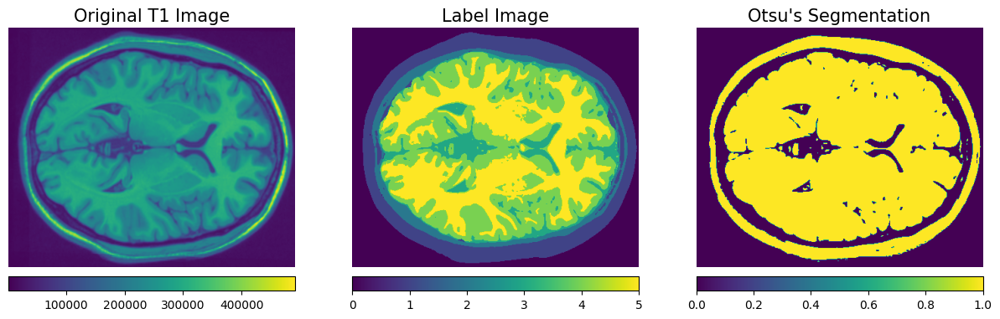

Level  0 Image
Dice coefficient: 0.6800213410094794
Jaccard index: 0.5151760116557785
Pixel accuracy: 0.570559094125973
Sensitivity: 0.7997869452916369
Specificity: 0.266004885804025


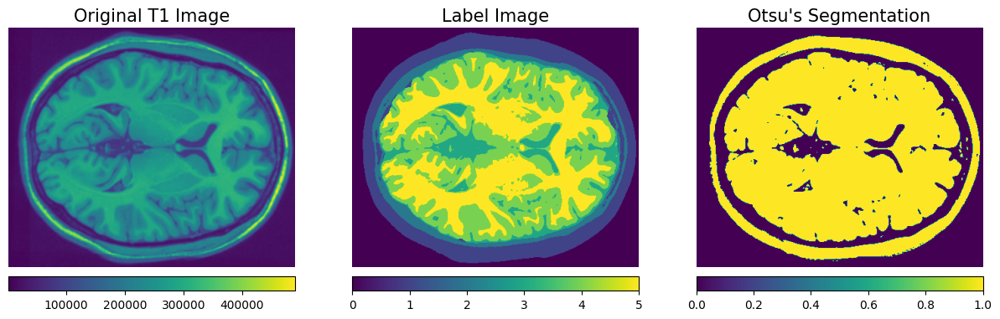

Level  1 Image
Dice coefficient: 0.6699499364023134
Jaccard index: 0.5037027964121504
Pixel accuracy: 0.5628666982016747
Sensitivity: 0.7882080618052074
Specificity: 0.2727100142382534


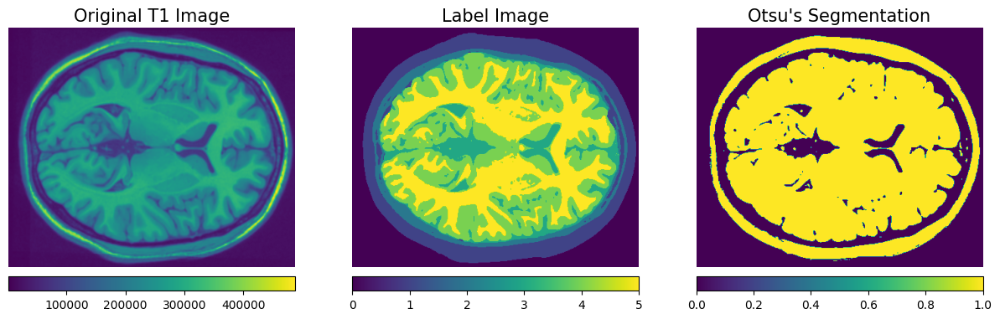

Level  2 Image
Dice coefficient: 0.6614407369446659
Jaccard index: 0.49414378219974475
Pixel accuracy: 0.5550899597592205
Sensitivity: 0.7829518902402492
Specificity: 0.27079907310509793


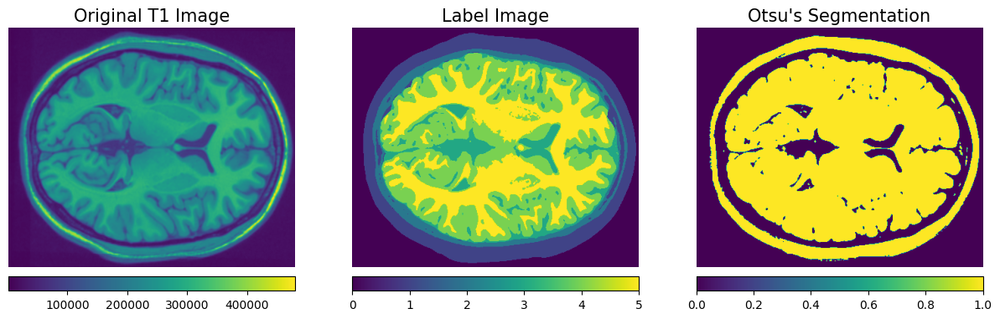

Level  3 Image
Dice coefficient: 0.6543237405946776
Jaccard index: 0.4862415726081358
Pixel accuracy: 0.5484791744684392
Sensitivity: 0.7791315166595861
Specificity: 0.26829717824428184


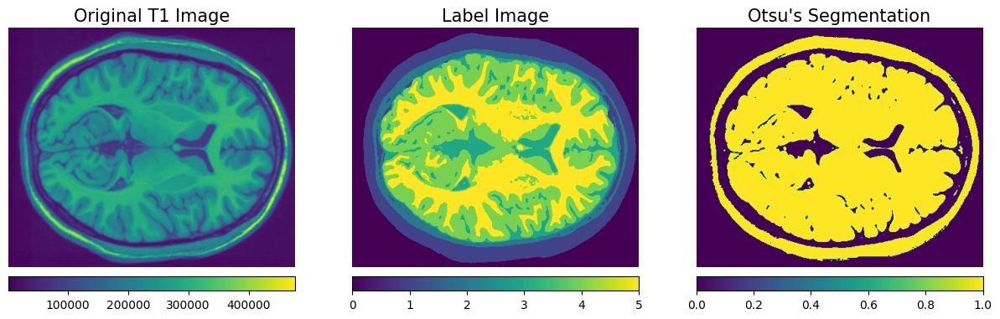

Level  4 Image
Dice coefficient: 0.6515168003482336
Jaccard index: 0.4831478809053623
Pixel accuracy: 0.5465608289326825
Sensitivity: 0.7755223334704887
Specificity: 0.27057807821598484


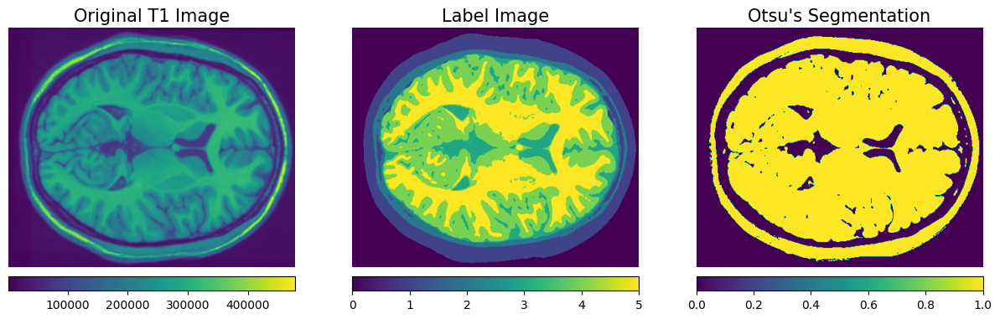

Level  5 Image
Dice coefficient: 0.6586588504249762
Jaccard index: 0.4910449892882647
Pixel accuracy: 0.5517643309965451
Sensitivity: 0.7837809085244457
Specificity: 0.266159055618955


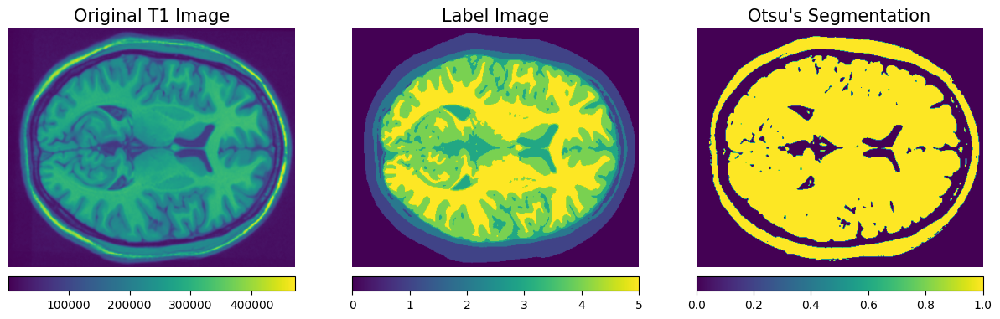

Level  6 Image
Dice coefficient: 0.6637251208438959
Jaccard index: 0.49669804558704067
Pixel accuracy: 0.5584630089207862
Sensitivity: 0.7802549205062379
Specificity: 0.27793707156827374


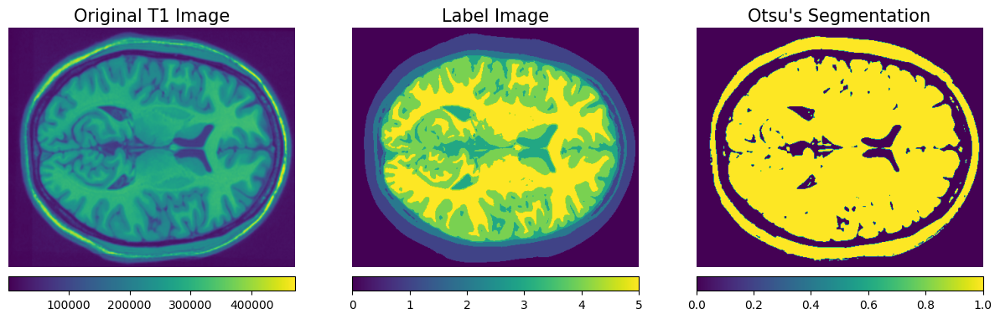

Level  7 Image
Dice coefficient: 0.662724170664751
Jaccard index: 0.4955777679719126
Pixel accuracy: 0.5571687228935955
Sensitivity: 0.7808527682471547
Specificity: 0.27573026015518026


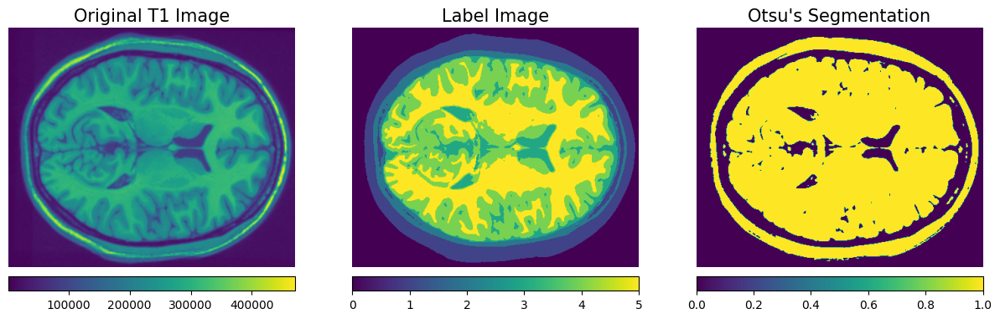

Level  8 Image
Dice coefficient: 0.6690554330547152
Jaccard index: 0.5026921854381182
Pixel accuracy: 0.5607938546868221
Sensitivity: 0.791666034616143
Specificity: 0.26600813480534574


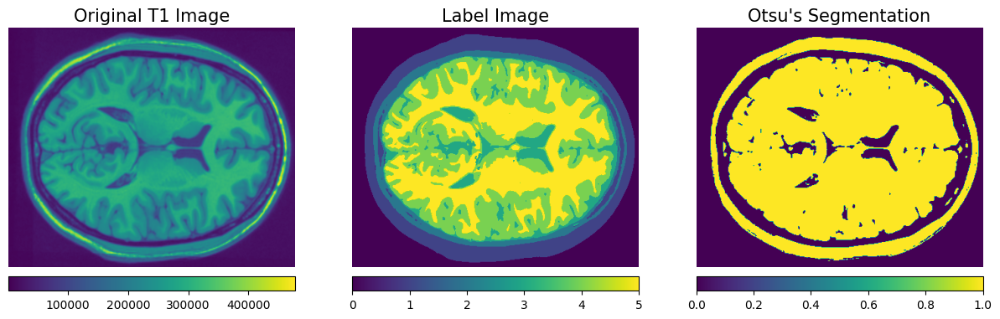

Level  9 Image
Dice coefficient: 0.6755509994874423
Jaccard index: 0.510061919504644
Pixel accuracy: 0.5665867853474837
Sensitivity: 0.7963746223564955
Specificity: 0.26619273301737756


In [10]:
otsu_segmentation_result, dice_coefficient, jaccard_index, pixel_accuracy, sensitivity, specificity = process_images_array_for_segmentation(T1, "otsu")


In [11]:
print(dice_coefficient, jaccard_index, pixel_accuracy, sensitivity, specificity)

0.664696712977515 0.49784869515711516 0.5578332458333223 0.7858530001717645 0.2700416484772775


KMeans Segmentation

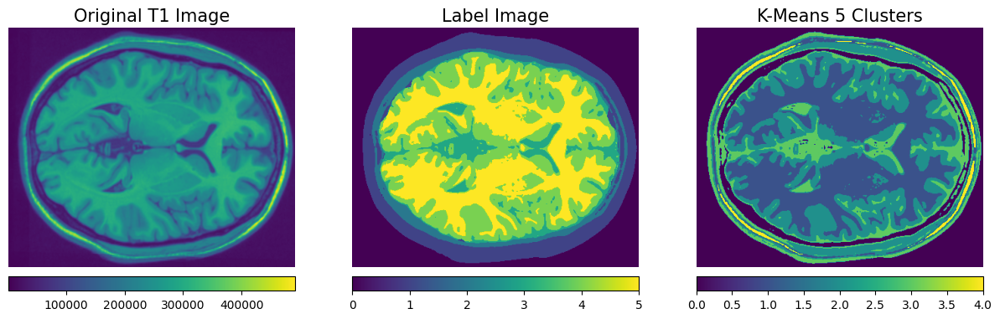

Level  0 Image
Dice coefficient: 0.25771737194287886
Jaccard index: 0.14791938333809151
Pixel accuracy: 0.47295776832534914
Sensitivity: 0.19344943023716363
Specificity: 0.7237832845092614


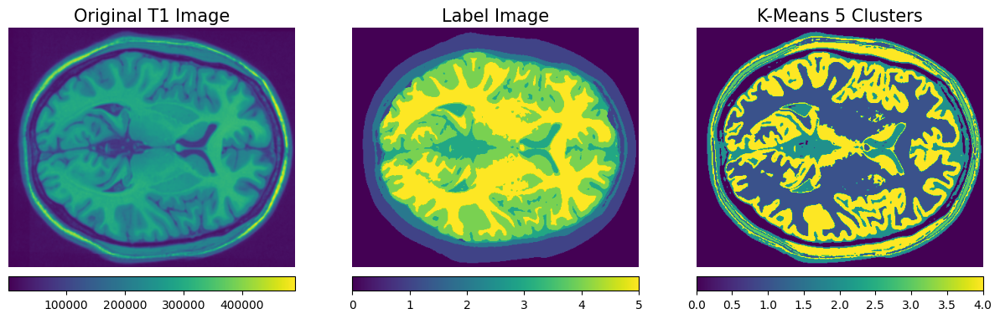

Level  1 Image
Dice coefficient: 0.5921082911559277
Jaccard index: 0.420563802909294
Pixel accuracy: 0.5953618885057141
Sensitivity: 0.49330103201690234
Specificity: 0.7455285251512287


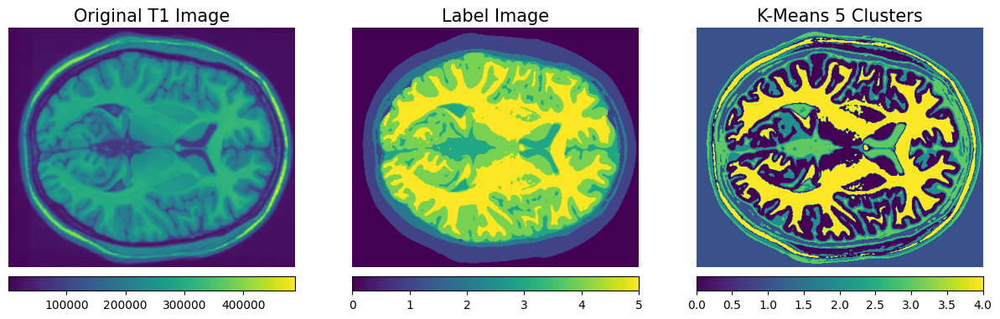

Level  2 Image
Dice coefficient: 0.4522818535766089
Jaccard index: 0.2922249471725735
Pixel accuracy: 0.5217776166200968
Sensitivity: 0.37841338783852835
Specificity: 0.6781990811980108


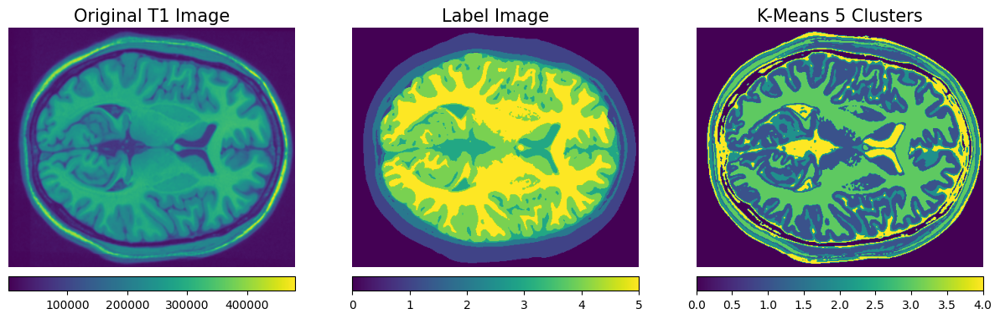

Level  3 Image
Dice coefficient: 0.15953759424116545
Jaccard index: 0.08668343006734065
Pixel accuracy: 0.4237139494523479
Sensitivity: 0.12908628321988602
Specificity: 0.6403387522888031


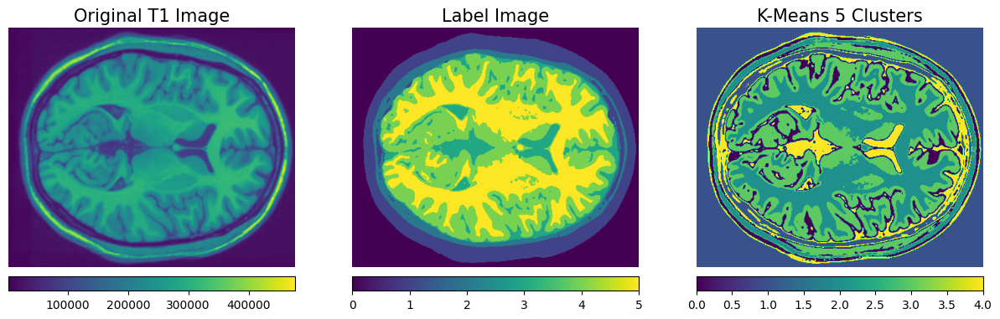

Level  4 Image
Dice coefficient: 0.030101452400142968
Jaccard index: 0.01528071201271703
Pixel accuracy: 0.3672616496523182
Sensitivity: 0.026734971378338017
Specificity: 0.5649142647416454


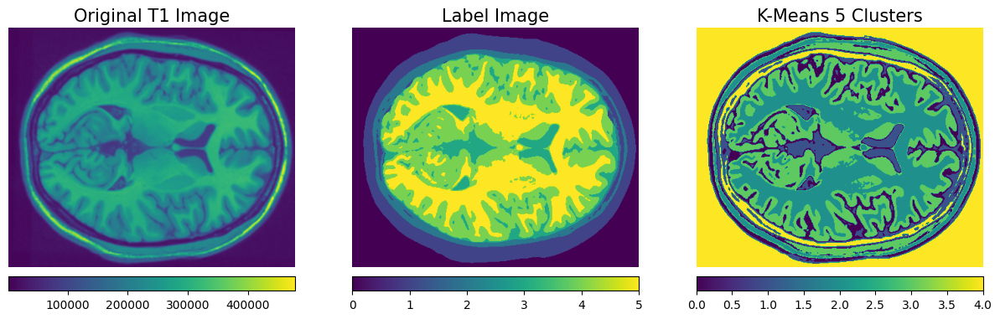

Level  5 Image
Dice coefficient: 0.054313866248229155
Jaccard index: 0.027915019440210742
Pixel accuracy: 0.3431337248194804
Sensitivity: 0.05497272453711444
Specificity: 0.49366323304765375


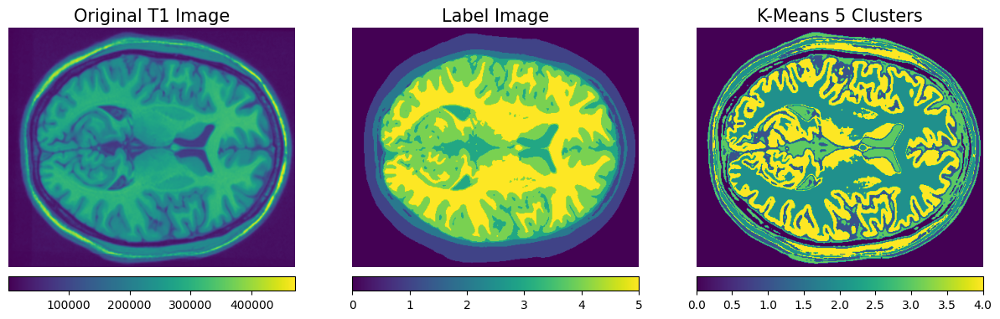

Level  6 Image
Dice coefficient: 0.5083813765503964
Jaccard index: 0.3408253078623303
Pixel accuracy: 0.5376914538171732
Sensitivity: 0.44455970819679724
Specificity: 0.6460090354682546


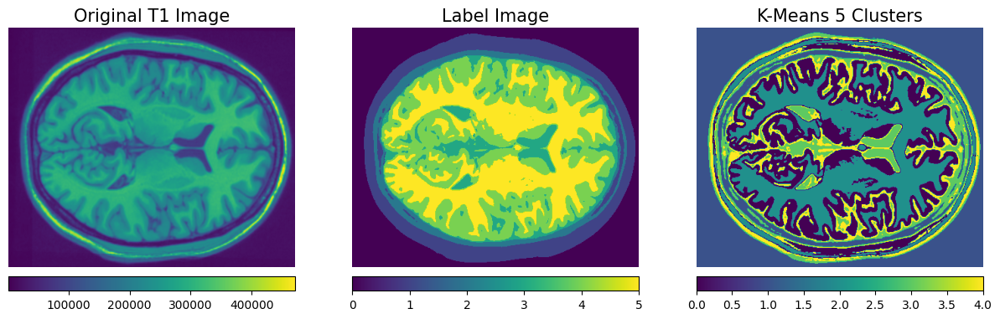

Level  7 Image
Dice coefficient: 0.20456689218629548
Jaccard index: 0.11393735099125815
Pixel accuracy: 0.4374779903744571
Sensitivity: 0.16534269017918188
Specificity: 0.6491198500745413


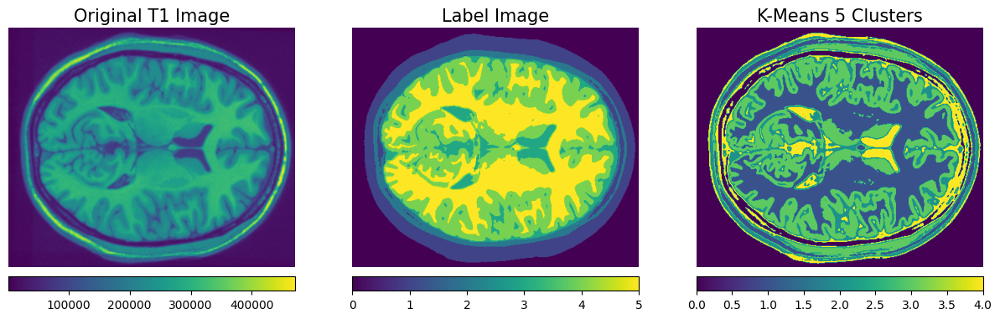

Level  8 Image
Dice coefficient: 0.16311737377953014
Jaccard index: 0.08880119581464872
Pixel accuracy: 0.4207979064186511
Sensitivity: 0.13414121186941477
Specificity: 0.6290577491643122


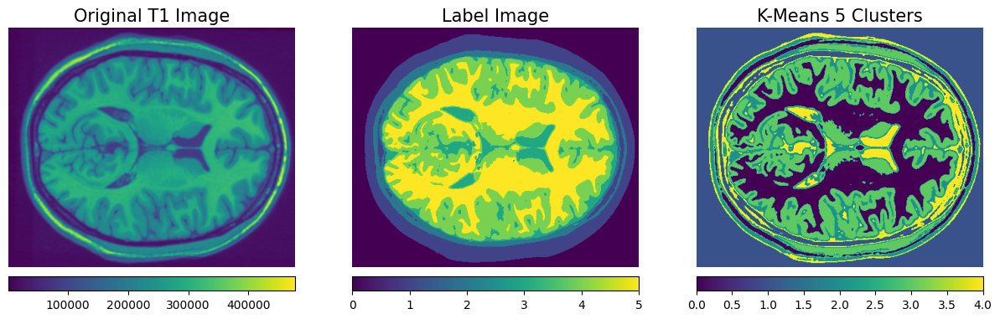

Level  9 Image
Dice coefficient: 0.05403124980753715
Jaccard index: 0.027765733546437105
Pixel accuracy: 0.38658397049455956
Sensitivity: 0.045315784852037994
Specificity: 0.6016562931326337
0.24761573218887123 0.15619168831549018 0.45067579184801476 0.20653172243253648 0.6372270068776346


In [12]:
kmeans_segmentation_result, dice_coefficient, jaccard_index, pixel_accuracy, sensitivity, specificity = process_images_array_for_segmentation(T1, "kmeans")
print(dice_coefficient, jaccard_index, pixel_accuracy, sensitivity, specificity)

Adaptive Gaussian Segmentation

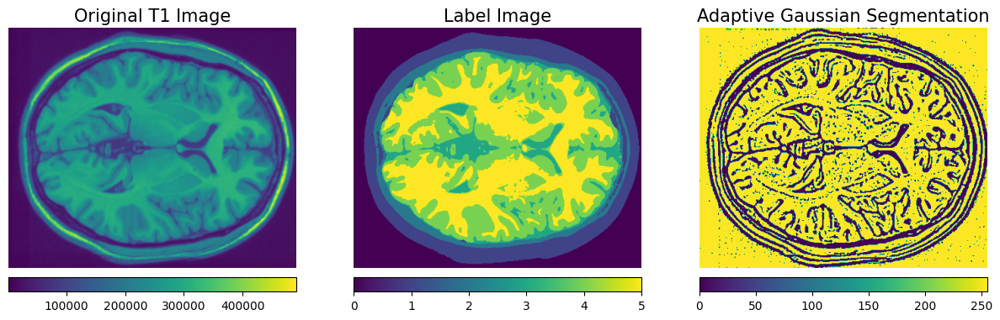

Level  0 Image
Dice coefficient: 0.019853268363456817
Jaccard index: 0.01002616020634419
Pixel accuracy: 0.013654907255224231
Sensitivity: 0.7315618590641106
Specificity: 0.003716242869971733


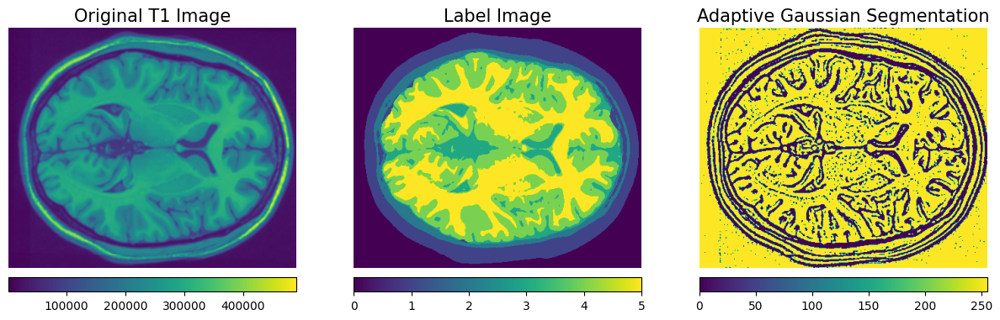

Level  1 Image
Dice coefficient: 0.019674712392789895
Jaccard index: 0.009935091227644969
Pixel accuracy: 0.013611224559489241
Sensitivity: 0.7272087802697871
Specificity: 0.0037642587203475662


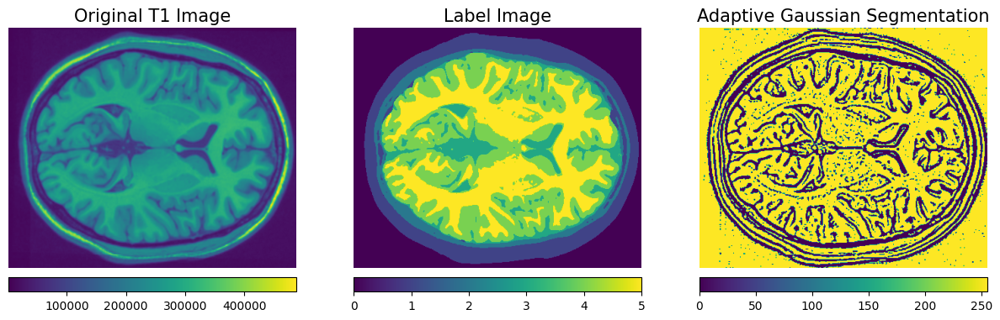

Level  2 Image
Dice coefficient: 0.01953351856143259
Jaccard index: 0.00986308970361562
Pixel accuracy: 0.013559306062845894
Sensitivity: 0.7246882984159427
Specificity: 0.00378434876765025


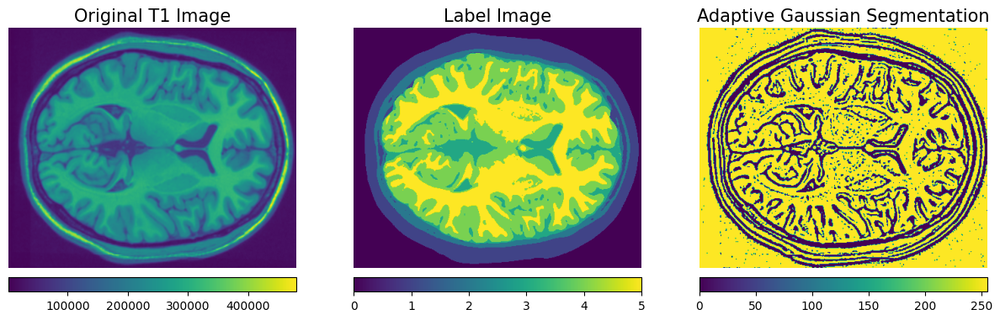

Level  3 Image
Dice coefficient: 0.019442115066791433
Jaccard index: 0.009816484140501196
Pixel accuracy: 0.01351762697836858
Sensitivity: 0.7234843627373032
Specificity: 0.003789054260294469


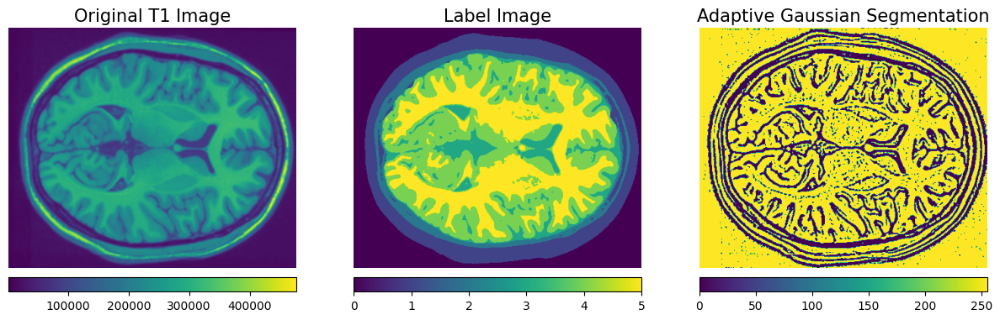

Level  4 Image
Dice coefficient: 0.019377051684071885
Jaccard index: 0.009783311710362482
Pixel accuracy: 0.013499042935444421
Sensitivity: 0.7220215864137713
Specificity: 0.003803790065539361


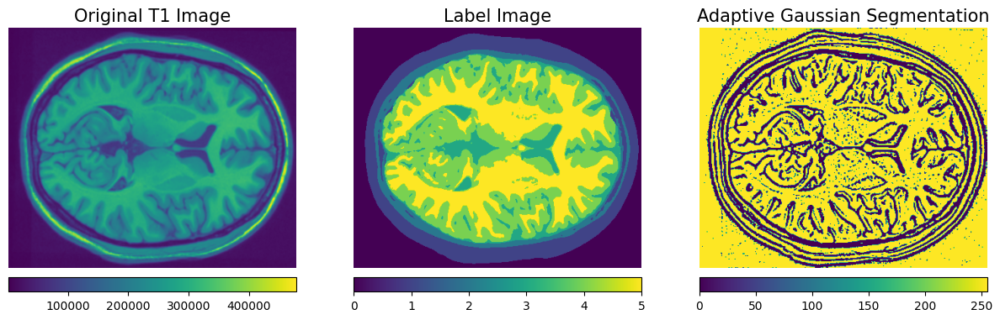

Level  5 Image
Dice coefficient: 0.019390126229568795
Jaccard index: 0.009789977565171054
Pixel accuracy: 0.013475434610328005
Sensitivity: 0.7238015385367184
Specificity: 0.003772733530919752


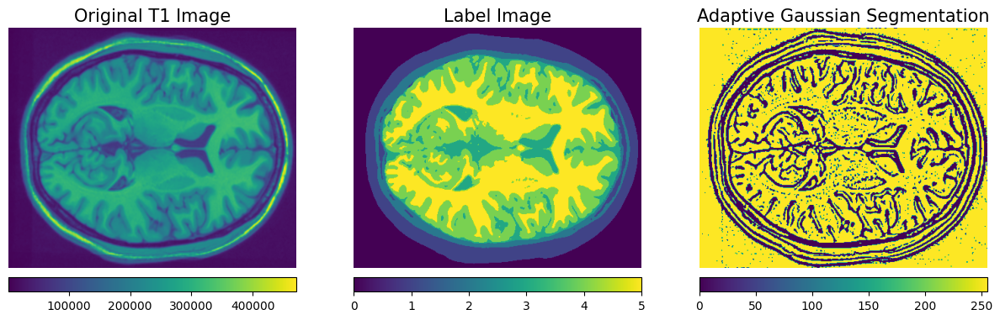

Level  6 Image
Dice coefficient: 0.01934159244827538
Jaccard index: 0.00976523381039912
Pixel accuracy: 0.013488076391312782
Sensitivity: 0.7212682216118678
Specificity: 0.0038109580123806687


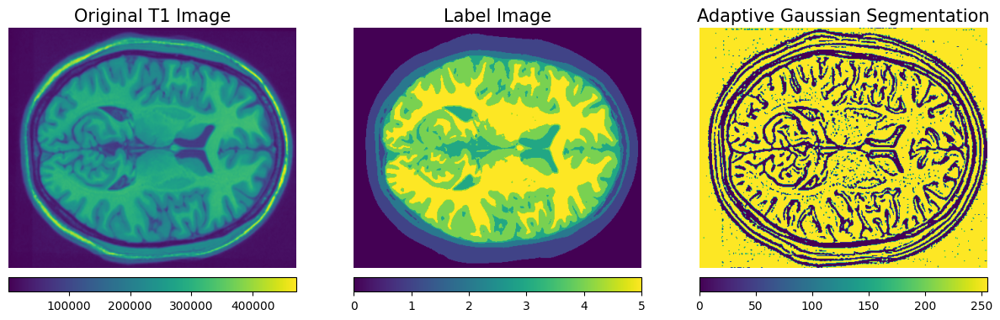

Level  7 Image
Dice coefficient: 0.01928288589635981
Jaccard index: 0.009735305339190824
Pixel accuracy: 0.01347008823369139
Sensitivity: 0.7200092880455115
Specificity: 0.003822995683819097


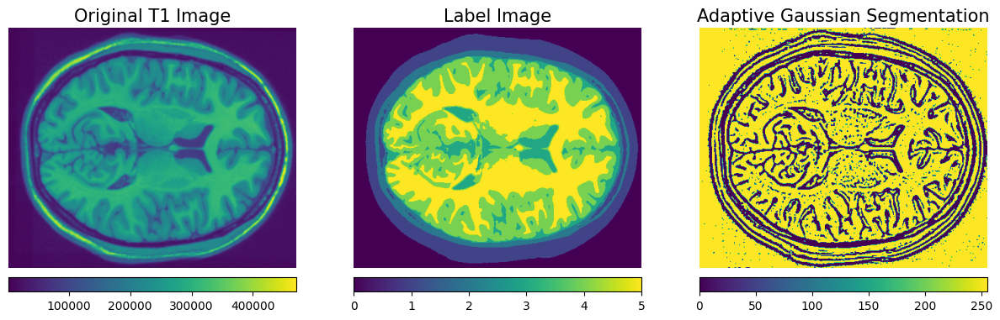

Level  8 Image
Dice coefficient: 0.01925959333116084
Jaccard index: 0.009723431332201252
Pixel accuracy: 0.013473340523203708
Sensitivity: 0.7189465236363825
Specificity: 0.00383844588070787


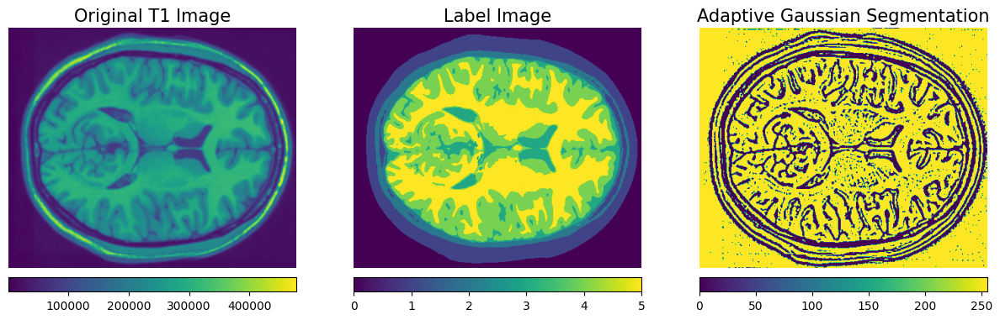

Level  9 Image
Dice coefficient: 0.019239360370923005
Jaccard index: 0.009713117267175615
Pixel accuracy: 0.01343923139733554
Sensitivity: 0.720024070620929
Specificity: 0.003813917419338224
0.019439422434483045 0.009815120230260632 0.01351882789472438 0.7233014529352324 0.003791674521096899


In [13]:
adaptive_gaussian_segmentation_result, dice_coefficient, jaccard_index, pixel_accuracy, sensitivity, specificity = process_images_array_for_segmentation(T1, "adaptive_gaussian")
print(dice_coefficient, jaccard_index, pixel_accuracy, sensitivity, specificity)

Region Growing Segmentaton

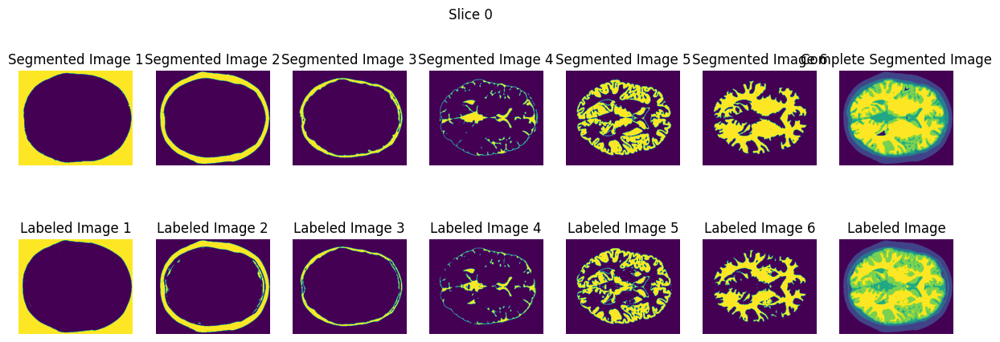

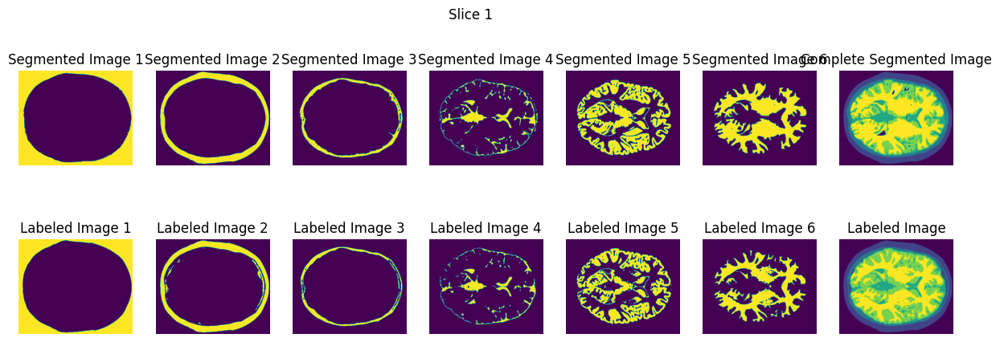

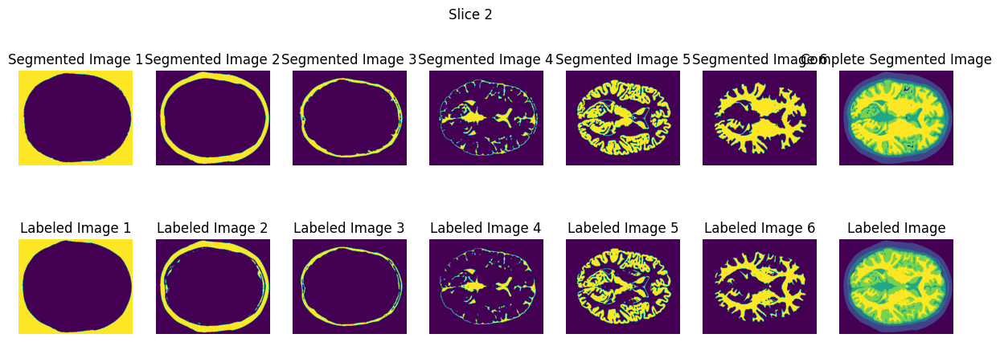

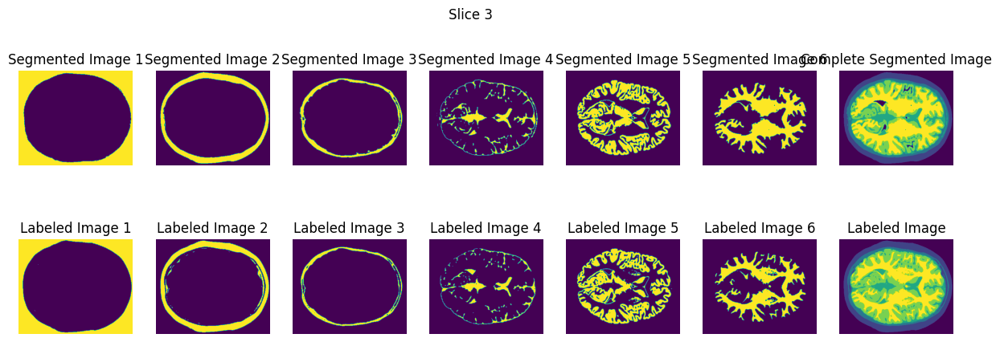

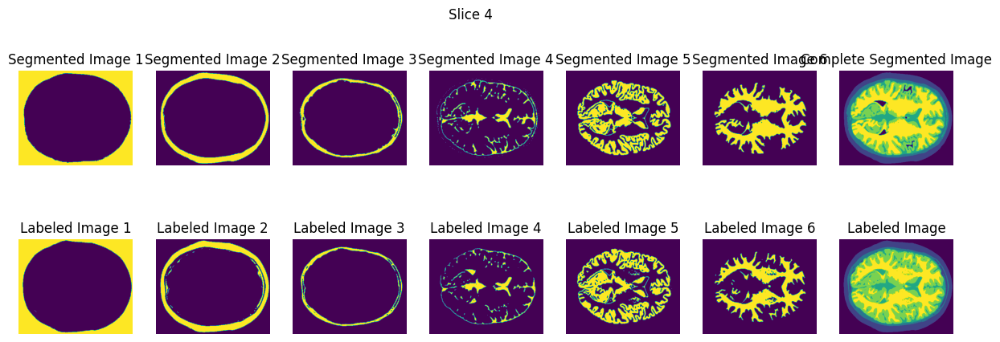

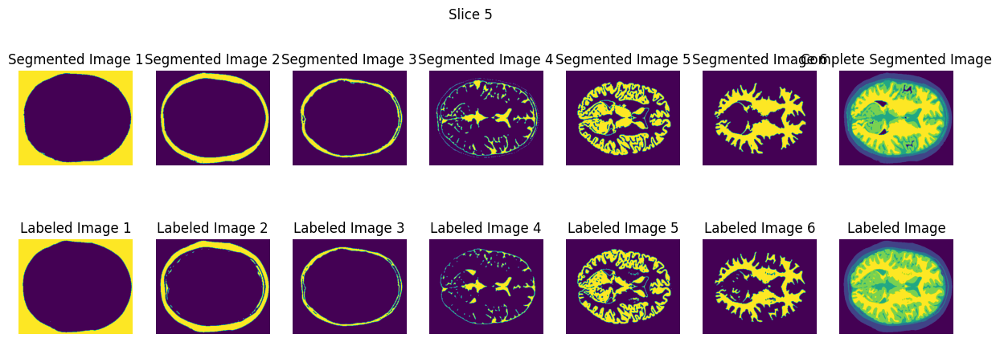

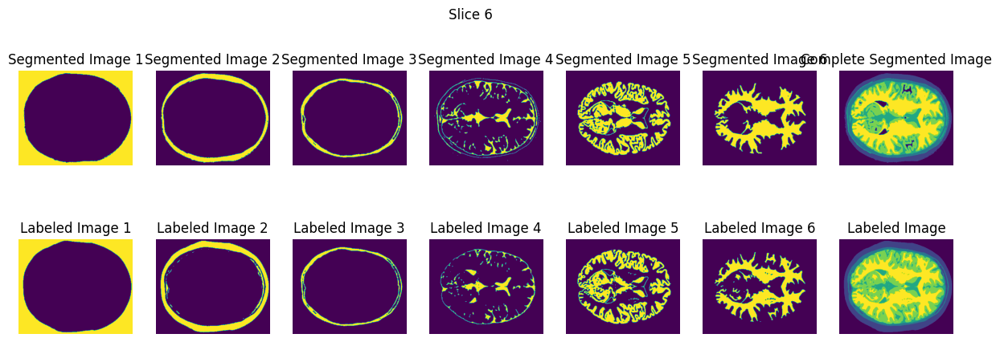

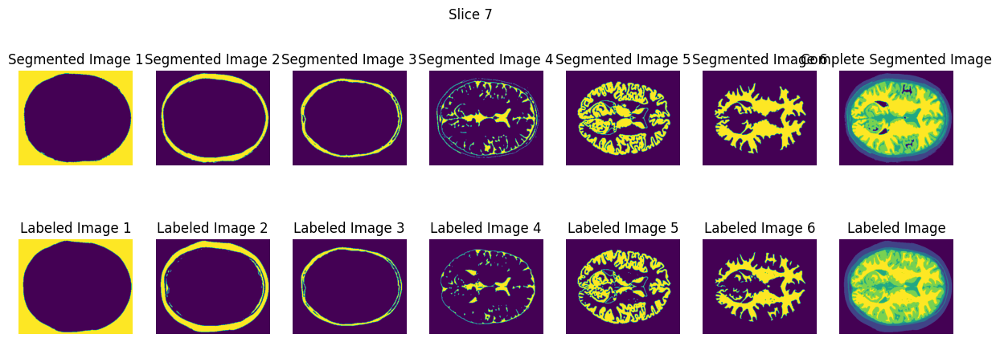

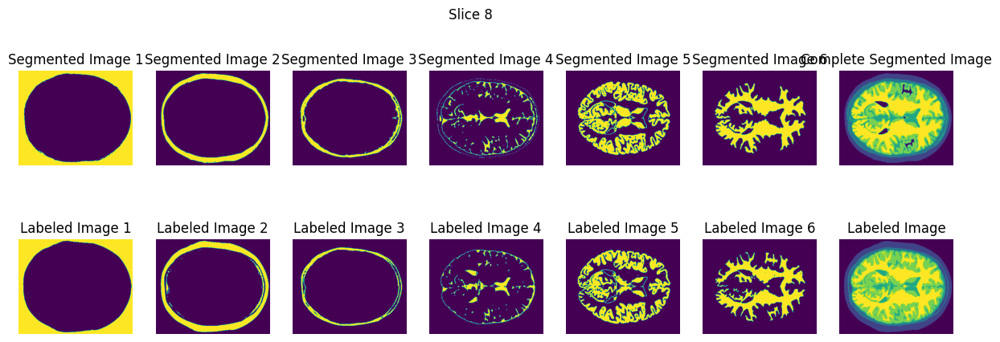

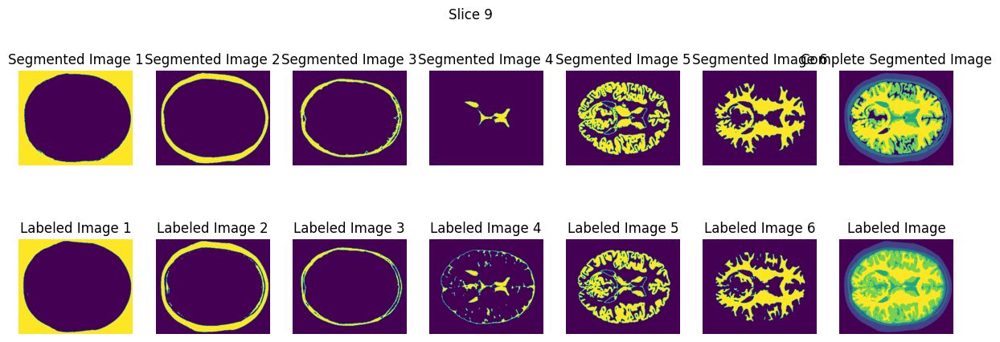

In [ ]:
segmented_image_array = []
for i in range(10):
  # Seed Points for Sections (y,x)
  image = T1[:, :, i]
  seed_point_air = (50, 50)
  seed_point_skin_scalp = (70, 70)
  seed_point_bone = (80, 80)
  seed_point_csf = (180, 280) # (y,x)
  seed_point_gray_matter = (160, 200)
  seed_point_white_matter = (120, 120)

  # Apply Region Growing to the segments
  segmented_image1 = region_growing(image,seed_point_air, 70) #Air
  segmented_image2 = region_growing(image,seed_point_skin_scalp, 150) #Skin / Scalp
  segmented_image3 = region_growing(image,seed_point_bone, 33) # Bone
  segmented_image4 = region_growing(image, seed_point_csf, 66)
  segmented_image5 = region_growing(image, seed_point_gray_matter, 25) # Grey Matter
  segmented_image6 = region_growing(image, seed_point_white_matter, 30) #White matter
  #segmented_image7 = kmeans_segmentation(T1[:,:,0], 5)


  # minimizations
  n_seg_1 = segmented_image1
  n_seg_2 = segmented_image2 # - segmented_image1
  n_seg_3 = segmented_image3 # - segmented_image2
  n_seg_4 = refine_csf_slice(segmented_image4, segmented_image1, segmented_image2, segmented_image3, segmented_image5, segmented_image6)
  n_seg_5 = segmented_image5
  n_seg_6 = segmented_image6
  segmented_image_array.append([n_seg_1, n_seg_2, n_seg_3, n_seg_4, n_seg_5, n_seg_6])

  # Create subplots for visualisation
  fig, axes = plt.subplots(2, 7, figsize=(15, 5))
  for ind in range(6):
    # Display segmented images according to labels
    axes[0][ind].imshow(segmented_image_array[i][ind])
    axes[0][ind].set_title('Segmented Image '+str(ind+1))
    axes[0][ind].axis('off')

    axes[1][ind].imshow(label[:,:,i]==ind)
    axes[1][ind].set_title('Labeled Image '+str(ind+1))
    axes[1][ind].axis('off')

  # Display the combined image with complete labeled image
  combined_image = combine_images([ n_seg_1, n_seg_2, n_seg_3, n_seg_4, n_seg_5, n_seg_6], [0, 40, 80, 120, 160, 200])
  axes[0][6].imshow(combined_image)
  axes[0][6].set_title('Complete Segmented Image')
  axes[0][6].axis('off')
  fig.suptitle("Slice "+str(i))

  axes[1][6].imshow(label[:,:,i])
  axes[1][6].set_title('Labeled Image')
  axes[1][6].axis('off')

  # Show the plot
  plt.show()

# Part 2: Result Evaluation

In [ ]:
def evaluate_results_for_region_growing(image_array, ground_truth):
  jaccard_indexes = []
  dice_coefficients = []
  pixel_accuracies = []
  sensitivities = []
  specificities = []

  for i in range(len(image_array)):
    img = image_array[i]
    ji = []
    dc = []
    pa = []
    se = []
    sp = []
    for j in range(len(img)):
      img_label = img[j]
      dice_coefficient, jaccard_index, pixel_accuracy, sensitivity, specificity = evaluation_metrics(img_label, label[:,:,i]==j, print_metrics = False)
      dc.append(dice_coefficient)
      ji.append(jaccard_index)
      pa.append(pixel_accuracy)
      se.append(sensitivity)
      sp.append(specificity)
    jaccard_indexes.append(ji)
    dice_coefficients.append(dc)
    pixel_accuracies.append(pa)
    sensitivities.append(se)
    specificities.append(sp)
    print(f"----- Slice {i} -----")
    print(f"Dice Coefficient: {np.mean(dc)}")
    print(f"Jaccard Index: {np.mean(ji)}")
    print(f"Pixel Accuracy: {np.mean(pa)}")
    print(f"Sensitivity: {np.mean(se)}")
    print(f"Specificity: {np.mean(sp)}")

  print(f"----- Overall Metrics -----")
  print(f"Dice Coefficient: {np.mean(dice_coefficients)}")
  print(f"Jaccard Index: {np.mean(jaccard_indexes)}")
  print(f"Pixel Accuracy: {np.mean(pixel_accuracies)}")
  print(f"Sensitivity: {np.mean(sensitivities)}")
  print(f"Specificity: {np.mean(specificities)}")

evaluate_results_for_region_growing(segmented_image_array, label)


----- Slice 0 -----
Dice Coefficient: 0.8828686753543536
Jaccard Index: 0.7959347721598027
Pixel Accuracy: 0.8064539894100733
Sensitivity: 0.9440591919665899
Specificity: 0.27277339082229235
----- Slice 1 -----
Dice Coefficient: 0.8798743648727106
Jaccard Index: 0.7912883643601208
Pixel Accuracy: 0.8019550463482172
Sensitivity: 0.9434464632018743
Specificity: 0.26983782014123936
----- Slice 2 -----
Dice Coefficient: 0.8839483216230275
Jaccard Index: 0.7972115144947955
Pixel Accuracy: 0.8068936603095486
Sensitivity: 0.9459398645838673
Specificity: 0.2731911090028489
----- Slice 3 -----
Dice Coefficient: 0.8808016382734043
Jaccard Index: 0.7922616354367733
Pixel Accuracy: 0.8050214750965673
Sensitivity: 0.9305067322658664
Specificity: 0.3054972504301599
----- Slice 4 -----
Dice Coefficient: 0.8756744010104814
Jaccard Index: 0.7845751656351693
Pixel Accuracy: 0.799086226609611
Sensitivity: 0.9241550032862262
Specificity: 0.30575001038155153
----- Slice 5 -----
Dice Coefficient: 0.86270634

# Advanced 2D Tissue Segmentation

3D Region Growing Algorithm

In [ ]:
def plot_advanced_2d_segmentation(image, label_area, angle = None):
  figure = plt.figure(figsize=(15, 15))
  axes = figure.add_subplot(111, projection = '3d')

  x, y, z = np.nonzero(image)
  axes.scatter(x, y, z)
  axes.set_xlabel('X')
  axes.set_ylabel('Y')
  axes.set_zlabel('Z Slices')
  if angle != None:
    azim, elev = angle
    axes.view_init(azim=azim, elev = elev)
  title = "Advanced 2D Segmentation Visualisation, Region: "+str(label_area)
  plt.title(title)
  plt.show()


def region_growing_segmentation_3d(image, seed_points, intensity_threshold):
  # 3D segmentation mask
  segmentation_mask = np.zeros_like(image, dtype=np.uint8)

  q = dq([seed_points])

  # Region Growing Loop
  while q:
    cur_point = q.popleft()
    x, y, z = cur_point

    # Check if the point is in image bound
    if(0 <= x < image.shape[0] and 0 <= y < image.shape[1] and 0 <= z < image.shape[2] and segmentation_mask[x, y, z] == 0):
      # Check if the intensity is within threshold
      if abs(image[x, y, z] - image[seed_points]) < intensity_threshold:

          # Assign value 1 to segmented region
          segmentation_mask[x, y, z] = 1

          # Enqueue neighboring points
          for i in range(-1, 2):
              for j in range(-1, 2):
                  for k in range(-1, 2):
                      q.append((x + i, y + j, z + k))

  return segmentation_mask


Applying Segmentation Algorithm to 3D Volumetric Data

In [ ]:
def apply_3d_segmentation(data, seed_points_array, intensity_threshold_array):
  T1_normalised = cv2.normalize(T1, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX)
  air_3D = region_growing_segmentation_3d(T1_normalised, seed_points_array[0], intensity_threshold_array[0])
  skin_3D = region_growing_segmentation_3d(T1_normalised, seed_points_array[1], intensity_threshold_array[1])
  bone_3D = region_growing_segmentation_3d(T1_normalised, seed_points_array[2], intensity_threshold_array[2])
  csf_3D = region_growing_segmentation_3d(T1_normalised, seed_points_array[3], intensity_threshold_array[3])
  gm_3D = region_growing_segmentation_3d(T1_normalised, seed_points_array[4], intensity_threshold_array[4])
  wm_3D = region_growing_segmentation_3d(T1_normalised, seed_points_array[5], intensity_threshold_array[5])
  return [air_3D, skin_3D, bone_3D, csf_3D, gm_3D, wm_3D]

seed_point_air = (50, 50, 0)
seed_point_skin_scalp = (70, 70, 0)
seed_point_bone = (80, 80, 0)
seed_point_csf = (180, 280, 0)
seed_point_gray_matter = (160, 200, 0)
seed_point_white_matter = (120, 120, 0)
thresholds = [70, 150, 33, 50, 25, 30]
mri_array = apply_3d_segmentation(T1, [seed_point_air, seed_point_skin_scalp, seed_point_bone, seed_point_csf, seed_point_gray_matter, seed_point_white_matter], thresholds)



Visualise the 3D Segmented Data from mri_array

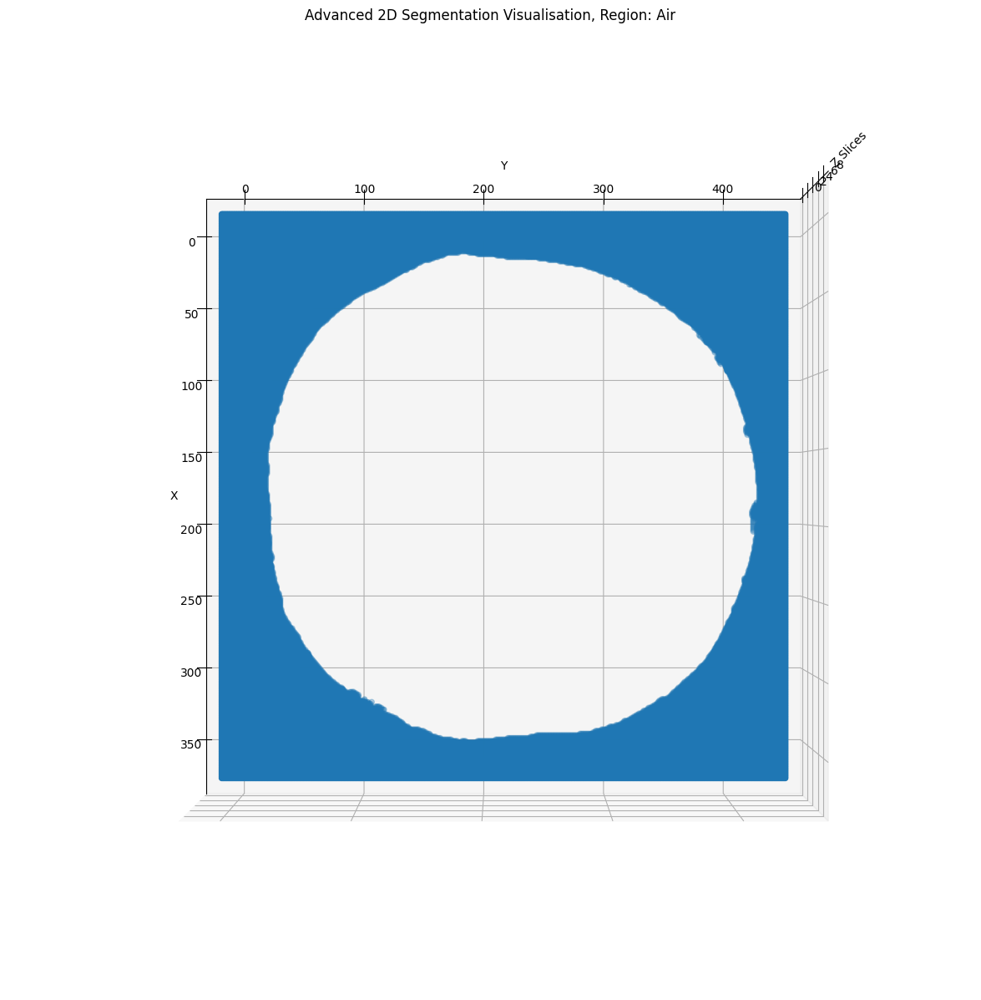

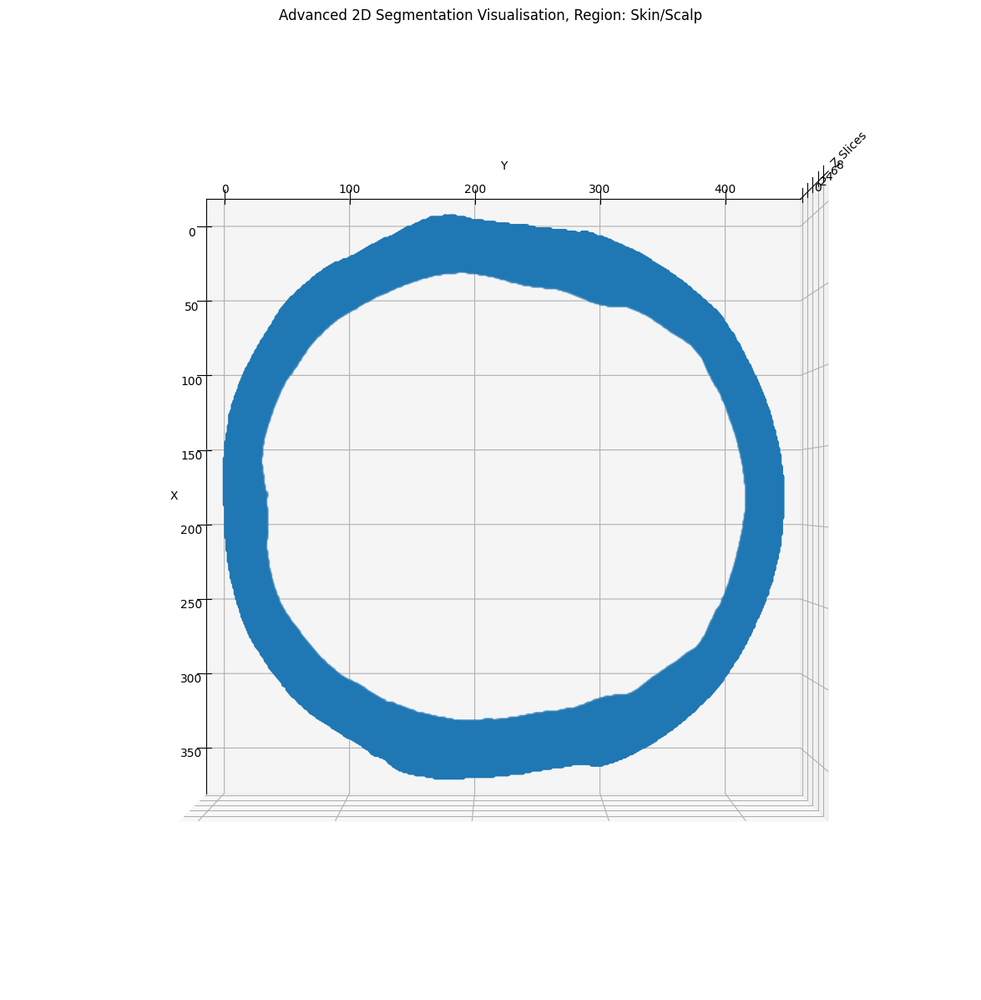

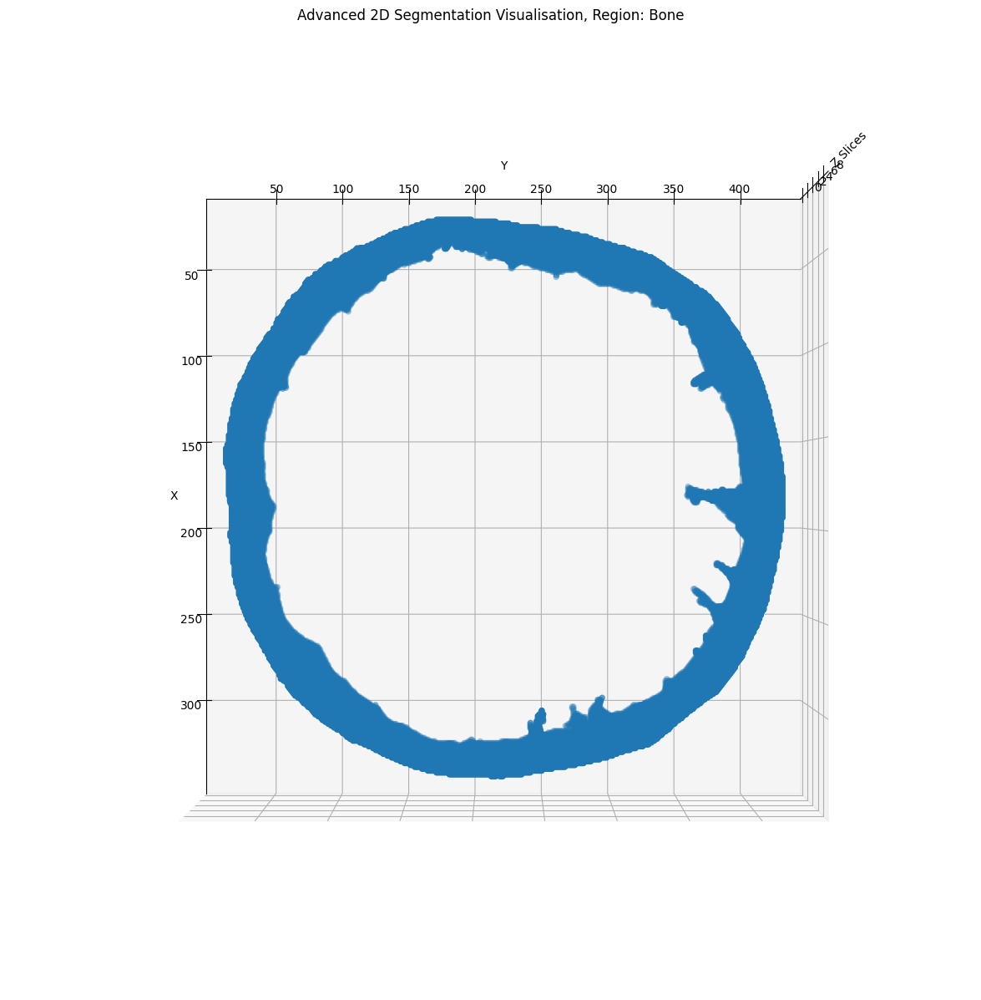

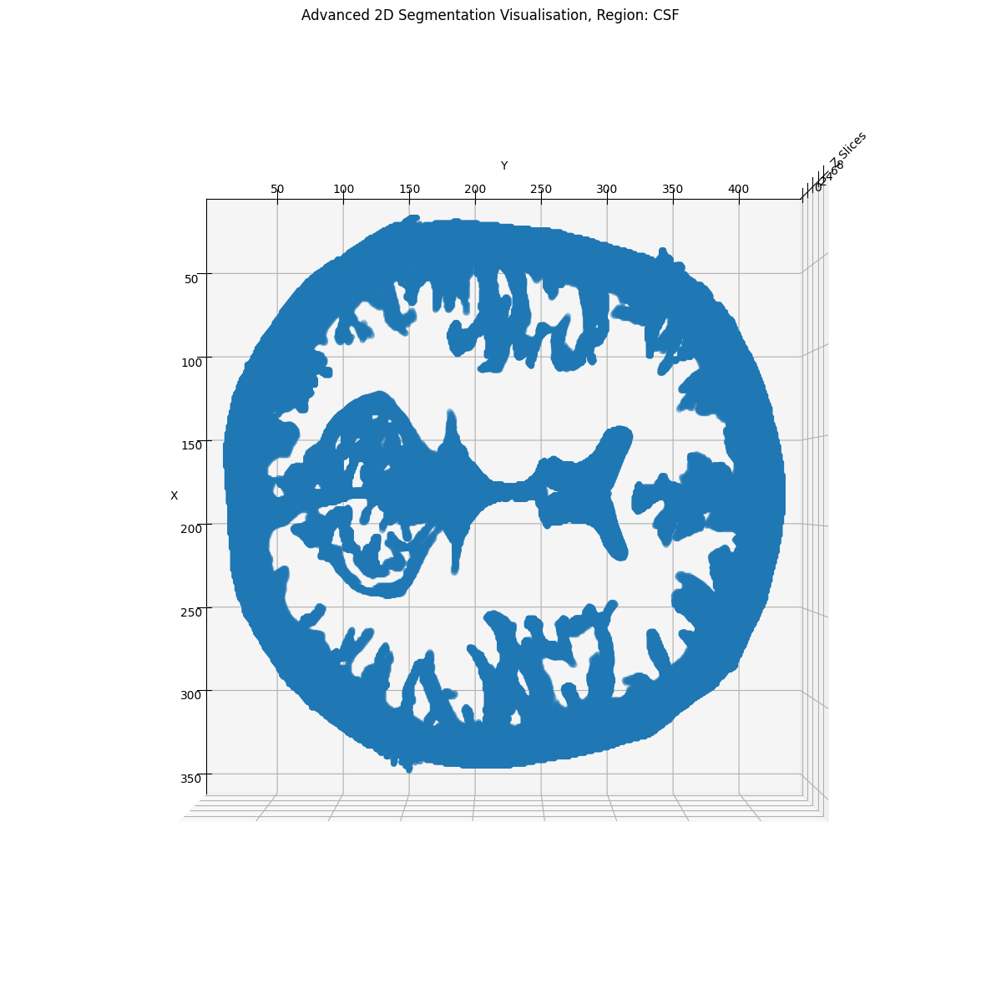

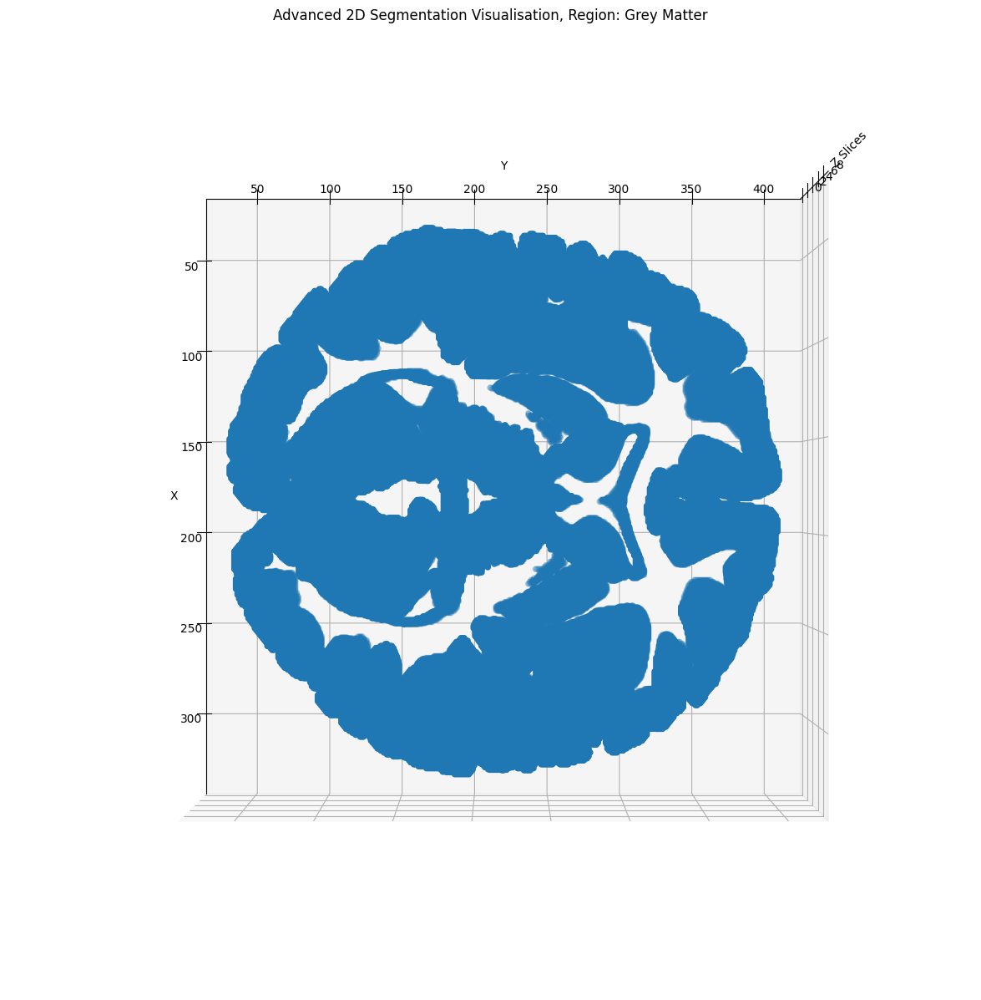

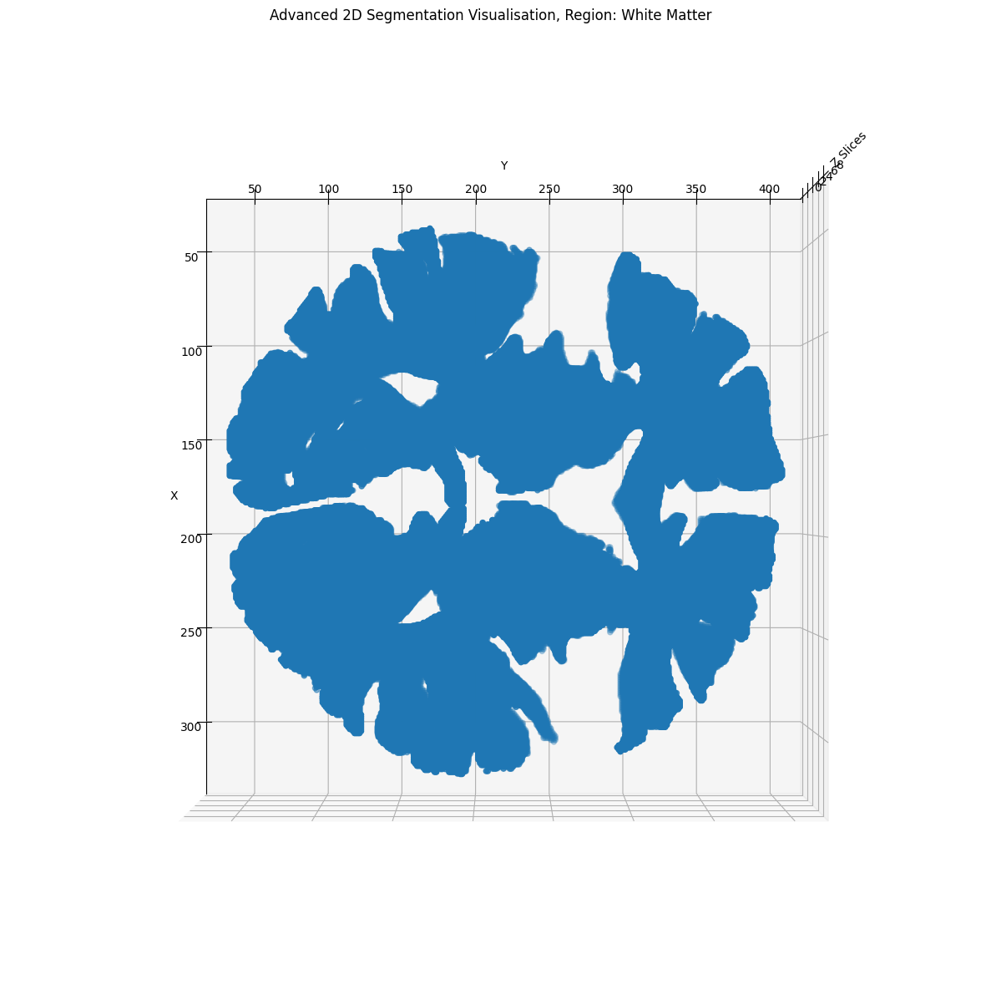

In [ ]:
segmented_area_name = ['Air', 'Skin/Scalp', 'Bone', 'CSF', 'Grey Matter', 'White Matter']
for area_segmented in range(len(mri_array)):
  plot_advanced_2d_segmentation(mri_array[area_segmented], segmented_area_name[area_segmented], (0, 90))

Run Evaluation on 3D Segmented Volumetric Data

In [ ]:
def run_evaluation_on_3d_segmented_data(mri_array):
  jaccard_arr = [[],[],[],[],[]]
  jaccard_indexes = []
  dice_coefficients = []
  pixel_accuracies = []
  sensitivities = []
  specificities = []
  for i in range(len(mri_array)):
    ji = []
    dc = []
    pa = []
    se = []
    sp = []
    print(f"----- Section {i} -----")
    section_array = mri_array[i]
    for j in range(10):
      slice_image = section_array[:,:,j]
      dice_coefficient, jaccard_index, pixel_accuracy, sensitivity, specificity = evaluation_metrics(slice_image, label[:,:,j]==i, print_metrics = False)
      dc.append(dice_coefficient)
      ji.append(jaccard_index)
      pa.append(pixel_accuracy)
      se.append(sensitivity)
      sp.append(specificity)
    jaccard_indexes.append(ji)
    dice_coefficients.append(dc)
    pixel_accuracies.append(pa)
    sensitivities.append(se)
    specificities.append(sp)
    print(f"Dice Coefficient: {np.mean(dc)}")
    print(f"Jaccard Index: {np.mean(ji)}")
    print(f"Pixel Accuracy: {np.mean(pa)}")
    print(f"Sensitivity: {np.mean(se)}")
    print(f"Specificity: {np.mean(sp)}")

  print(f"----- Overall Metrics -----")
  print(f"Dice Coefficient: {np.mean(dice_coefficients)}")
  print(f"Jaccard Index: {np.mean(jaccard_indexes)}")
  print(f"Pixel Accuracy: {np.mean(pixel_accuracies)}")
  print(f"Sensitivity: {np.mean(sensitivities)}")
  print(f"Specificity: {np.mean(specificities)}")

run_evaluation_on_3d_segmented_data(mri_array)


----- Section 0 -----
Dice Coefficient: 0.9562540550617113
Jaccard Index: 0.9161768430879318
Pixel Accuracy: 0.916183073680422
Sensitivity: 0.999918176737674
Specificity: 0.0009040641523443699
----- Section 1 -----
Dice Coefficient: 0.9548017488608801
Jaccard Index: 0.9135189656248179
Pixel Accuracy: 0.9202874937043554
Sensitivity: 0.9150813185608732
Specificity: 0.9801357616786355
----- Section 2 -----
Dice Coefficient: 0.8500970050231139
Jaccard Index: 0.7392950117141486
Pixel Accuracy: 0.7392950117141486
Sensitivity: 1.0
Specificity: 0.0
----- Section 3 -----
Dice Coefficient: 0.49739890489306493
Jaccard Index: 0.3311229255017495
Pixel Accuracy: 0.35511579792687414
Sensitivity: 0.8988756238038716
Specificity: 0.05544501352553475
----- Section 4 -----
Dice Coefficient: 0.8677616623557091
Jaccard Index: 0.7664629772671432
Pixel Accuracy: 0.7794644193757109
Sensitivity: 0.9285352624033021
Specificity: 0.25323515064490604
----- Section 5 -----
Dice Coefficient: 0.8595472134684868
Jaccar